## Correcting Z depth in MS2 datasets

From the 120-mer data, it is apparent that sample depth has a significant effect on fluorescence intensity. The main problem here is that this effect could produce a spurious correlation between MS2 and protein (Rpb1) signals; if the spot moves significantly in Z, the signal for both will be similarly effected. In this notebook I used a correction function derived from the 120-mer to adjust MS2 movie data. It seems to do a reasonable job, though at the end I note some experimental controls that will be important for validating that the various signal corrections (principally bleaching and Z depth) are sufficient.

In [100]:
# Import public packages.
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import ndimage as ndi 
from importlib import reload
from copy import deepcopy
import pickle
import czifile
import imageio
from skimage.filters.thresholding import threshold_otsu

# The order of loading matplotlib is important to avoid issues on my machine.
%matplotlib inline
import matplotlib as mpl
#%matplotlib notebook
#%matplotlib notebook

# Import my packages.
import sys
sys.path.append('/Users/michaelstadler/Bioinformatics/Projects/rpb1/bin')
import imagep as imp
reload(imp)
from imagep import viewer, save_pickle, load_pickle, box_spots, read_czi
import notebook_functions_20210504 as nf

In [2]:
sna_em3 = imp.load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210412-Rpb1GFP-snaMS2-zsmv-em3-04-08.czi.pkl')

hb_em1 = imp.load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210311-Rpb1GFP-HbMS2-em1-zsmv-03-07.pkl')

hb_em2 = imp.load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210311-Rpb1GFP-HbMS2-em2-zsmv-01-04.pkl')


In [17]:
mv = sna_em3
ij_rad = 2
z_rad = 1.5
ij_scale = 1
z_scale = 1
protchannel = 0
spotchannel=1

spot_data = imp.add_volume_mean(mv.spot_data, mv.stack, protchannel, ij_rad, z_rad, ij_scale, z_scale)
mv.prot = imp.movie.make_spot_table(spot_data, mv.nucmask, 12)

10 20 30 40 50 60 70 80 90 100 

In [30]:
mv = sna_em3
mv.zslices = imp.movie.make_spot_table(mv.spot_data, mv.nucmask, 2)

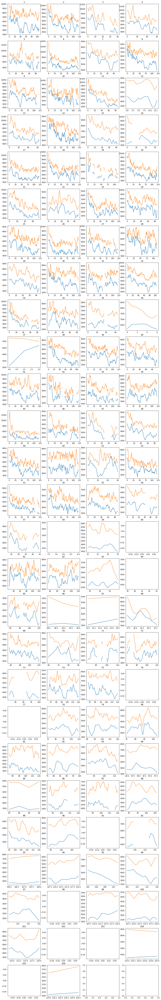

In [20]:
reload(nf)
nf.plot_traces(sna_em3.intvol, sna_em3.prot,sna_em3.stack[0],minlen=0, sigma=0.8, norm=False)

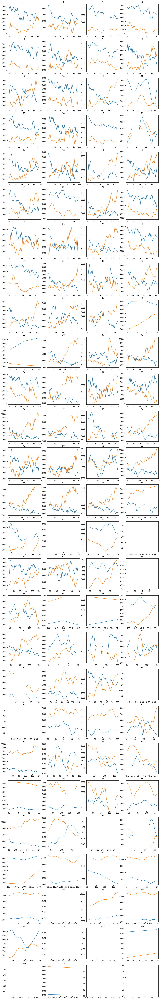

In [32]:
reload(nf)
nf.plot_traces(sna_em3.intvol, sna_em3.zslices*500,sna_em3.stack[0],minlen=0, sigma=0.8, norm=False)

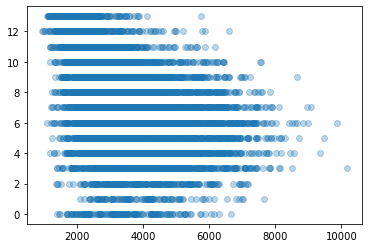

In [36]:
plt.scatter(sna_em3.intvol, sna_em3.zslices, alpha=0.3)

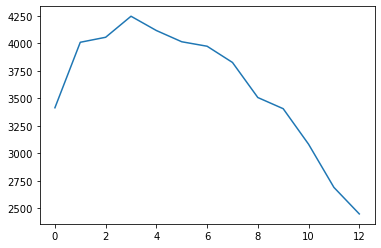

In [52]:
means = []
for n in range(0,13):
    means.append(np.nanmean(sna_em3.intvol[sna_em3.zslices == n].to_numpy()))
plt.plot(means)

In [21]:
mv = sna_em3
ms2 = imp.spot_movies(mv.stack, mv.spot_data, len_ij=31, fill=0, channel=1)[:,:,2:5].mean(axis=2)
prot = imp.spot_movies(mv.stack, mv.spot_data, len_ij=31, fill=0, channel=0)[:,:,2:5].mean(axis=2)
viewer([ms2, prot], 5, order='stxy', color="cividis")

interactive(children=(Dropdown(description='Color', index=4, options=('inferno', 'viridis', 'gray', 'Greens', …

In [29]:
mv = sna_em3
ms2 = imp.spot_movies(mv.stack, mv.spot_data, len_ij=31, fill=0, channel=1)[:,:,2:5]
prot = imp.spot_movies(mv.stack, mv.spot_data, len_ij=31, fill=0, channel=0)[:,:,2:5]
viewer([ms2, prot], 5, order='stzxy', color="cividis")

interactive(children=(Dropdown(description='Color', index=4, options=('inferno', 'viridis', 'gray', 'Greens', …

## Correct for depth

I think I'm going to try to write a correction function to correct for Z depth. What to use for the calibration? The easiest thing would be to use mean nuclear Rpb1 signal, but that would require removing the HLB and also assume that there isn't any polarity. Is it possible to use the 120-mers? That's probably the best, but the data I have presently was collected with different conditions, laser powers, etc. Then again, it's quite easy to re-collect that data. Then again, the three structures I imaged in those experiments all showed linear relationships with depth that were pretty similar...

Let's see what the fits actually say. Pulling in code from 20210324-ratiometric-quantitation-4

In [76]:
def make_plottable(datasets, surface, start, interval, bg_subtract=True, return_mean=True, min_spots_for_mean=4):
    """Build x and y vectors for plotting spot intensity values (via fg_bg) against 
    embryo depth."""
    x = []
    y = []
    for i in range(0, len(datasets)):
        x0, y0 = fg_bg_byz(datasets[i], bg_subtract=bg_subtract, return_mean=return_mean, min_spots_for_mean=min_spots_for_mean)
        y = y + y0
        x1 = (np.array(x0) * interval) + start[i] - surface[i]
        x = x + list(x1)
    return np.array(x),np.array(y)

def fg_bg_byz(spots_byz, inner_ij=5, outter_ij=9, inner_z=1, outter_z=1, bg_subtract=True, return_mean=True, min_spots_for_mean=4):
    """Wrapper: call fg_bg on stack for each z slice output by bundle_spots_byz, """
    y = []
    x = []
    n = len(spots_byz)
    for i in range(0, n):
        vals = fg_bg(spots_byz[i], inner_ij=inner_ij, outter_ij=outter_ij, inner_z=inner_z, 
                     outter_z=outter_z, bg_subtract=bg_subtract)
        vals = np.array(vals)
        low_cut, high_cut = np.percentile(vals, [10,90])
        vals_middle = vals[(vals >= low_cut) & (vals <= high_cut)]
        if (return_mean):
            if (len(vals) > min_spots_for_mean):
                y.append(np.nanmean(vals_middle))
            else:
                y.append(np.nan)
            x.append(i)
        else:
            y = y + list(vals_middle)
            x = x + ([i] * len(vals_middle))
    return x,y

def fg_bg(x, inner_ij=5, outter_ij=7, inner_z=1, outter_z=3, bg_subtract=True):
    """Perform foreground-background comparison for individual frames in an 4d
    array, where first dimension is spot ID. For each frame (spot ID), define an 
    inner box and a larger outter box, find the mean pixel value in the inner
    box and then in the positions that are in the outter box but not in inner box 
    ('background'), return the differences as a list."""
    # Get points for ij:
    midpoint = int(x.shape[-1] / 2)
    inner_rad_ij = int(inner_ij / 2)
    outter_rad_ij = int(outter_ij / 2)
    inner_start_ij = midpoint - inner_rad_ij
    inner_end_ij = midpoint + inner_rad_ij + 1
    outter_start_ij = midpoint - outter_rad_ij
    outter_end_ij = midpoint + outter_rad_ij + 1
    # Get points for z:
    midpoint_z = int(x.shape[-3] / 2)
    inner_rad_z = int(inner_z / 2)
    outter_rad_z = int(outter_z / 2)
    inner_start_z = midpoint_z - inner_rad_z
    inner_end_z = midpoint_z + inner_rad_z + 1
    outter_start_z = midpoint_z - outter_rad_z
    outter_end_z = midpoint_z + outter_rad_z + 1
    
    diffs = []
    for box in x:
        inner_box = box[inner_start_z:inner_end_z, inner_start_ij:inner_end_ij, inner_start_ij:inner_end_ij]
        if (bg_subtract):
            outter_box = box[outter_start_z:outter_end_z, outter_start_ij:outter_end_ij, outter_start_ij:outter_end_ij] 
            outter_mean = (np.sum(outter_box) - np.sum(inner_box)) / (outter_box.size - inner_box.size)
            inner_mean = np.mean(inner_box)
            bgsub_diff = inner_mean - outter_mean
            diffs.append(bgsub_diff)
        else:
            diffs.append(np.mean(inner_box))
    return diffs  

from scipy.optimize import curve_fit

def func(x, m, b):
    return (x * m) + b

## 120-mers

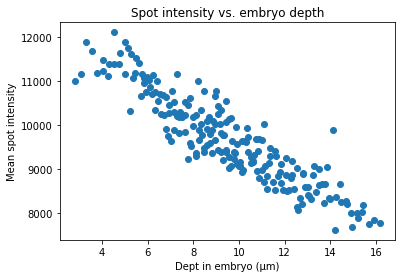

In [63]:
# Load 120-mer datasets
spots_byz_331_4_01 = load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210331_spots_byz_4_01.pkl')
spots_byz_331_4_02 = load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210331_spots_byz_4_02.pkl')
spots_byz_331_2_02 = load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210331_spots_byz_2_02.pkl')
spots_byz_331_5_01 = load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210331_spots_byz_5_01.pkl')
spots_byz_331_5_02 = load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210331_spots_byz_5_02.pkl')
spots_byz_331_6_01 = load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210331_spots_byz_6_01.pkl')
spots_byz_331_6_02 = load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210331_spots_byz_6_02.pkl')

datasets = [spots_byz_331_4_01, spots_byz_331_4_02, spots_byz_331_2_02, spots_byz_331_5_01, spots_byz_331_5_02, spots_byz_331_6_01, spots_byz_331_6_02]
surface = [1565.78, 1564.08, 1615.68, 1564.51, 1564.33, 1568.97, 1567.8]
start = [1573.99, 1569.91, 1620.8, 1573.48, 1568.38, 1571.79, 1574.71]

interval = float(0.240)

x_120,y_120 = make_plottable(datasets, surface, start, interval, return_mean=False)
x_120_means,y_120_means = make_plottable(datasets, surface, start, interval, return_mean=True, min_spots_for_mean=10)

# Plotting all Rpb1 spots.
plt.scatter(x_120_means, y_120_means);
plt.xlabel('Dept in embryo (µm)')
plt.ylabel('Mean spot intensity')
plt.title('Spot intensity vs. embryo depth');

In [65]:
curve_fit(func, x_120, y_120)

(array([ -308.18049027, 12624.59398906]),
 array([[  30.96240614, -281.95159428],
        [-281.95159428, 2851.87791347]]))

In [66]:
curve_fit(func, x_120_means, y_120_means)

(array([ -305.43251494, 12582.51083525]),
 array([[  89.94895016, -854.91431044],
        [-854.91431044, 8947.34990782]]))

## Rpb1

In [77]:
# Load rpb1 datasets
spots_byz_rpb1_4_02 = load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210331-rpbGFP-sisAMS2-488-3pct-em4-02.pkl')
spots_byz_rpb1_1_07 = load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210331-rpbGFP-sisAMS2-488-3pct-em1-07.pkl')
spots_byz_rpb1_2_08 = load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210331-rpbGFP-sisAMS2-488-3pct-em2-08.pkl')


# rpb1 datasets
datasets = [spots_byz_rpb1_4_02, spots_byz_rpb1_1_07, spots_byz_rpb1_2_08]
#datasets = [spots_byz_rpb1_2_08]
surface = [1292.75, 1301.6, 1300.97]
start = [1296.98, 1305.7, 1305.12]
interval = float(0.240)

x_r,y_r = make_plottable(datasets, surface, start, interval, return_mean=False)
x_r_means,y_r_means = make_plottable(datasets, surface, start, interval, return_mean=True, min_spots_for_mean=10)


In [70]:
curve_fit(func, x_r, y_r)

(array([ -338.01354617, 11254.57741421]),
 array([[  1861.53374108, -15534.54671799],
        [-15534.54671799, 135816.83901774]]))

In [79]:
# Load ms2 datasets
spots_byz_ms2_4_01 = load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210331-MCPGFP-hbMS2-488-3pct-em4-01.pkl')
spots_byz_ms2_6_01 = load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210331-MCPGFP-hbMS2-488-3pct-em6-01.pkl')
spots_byz_ms2_19_02 = load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210331-MCPGFP-hbMS2-488-3pct-em19-02.pkl')
spots_byz_ms2_15_01 = load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210331-MCPGFP-hbMS2-488-3pct-em15-01.pkl')
spots_byz_ms2_1_03 = load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210331-MCPGFP-hbMS2-488-3pct-em1-03.pkl')

# MS2 datasets
datasets = [spots_byz_ms2_4_01, spots_byz_ms2_6_01, spots_byz_ms2_19_02, spots_byz_ms2_15_01, spots_byz_ms2_1_03]
interval = float(0.240)
surface = [1432.66, 1419.6, 1373.14, 1331.35, 1428.40]
# 6-01 starts on slice 6
start = [1434.2, 1420.53 + (6 * interval), 1376.15, 1335.25, 1432.84 + (8 * interval)]

x_m,y_m = make_plottable(datasets, surface, start, interval, return_mean=False, min_spots_for_mean=5)
x_m_means,y_m_means = make_plottable(datasets, surface, start, interval, return_mean=True, min_spots_for_mean=5)



In [84]:
curve_fit(func, x_m[x_m > 6], y_m[x_m > 6])

(array([-138.81246275, 7616.27057869]),
 array([[  414.22580205, -3418.28602213],
        [-3418.28602213, 29087.31939551]]))

## Hand calibration

Just to see what this looks like, going by hand and looking at nuclear signal as a function of Z slice in teh snail movie (4-12 em3). Z-slice: 660 nm.

movie 4 frame 1, taking a mean in a large box with many nuclei, no HLB:

8: 4029  
9: 3833  
10: 3487  

Last frame:

8: 4033  
9: 3844  
10: 3574


In [85]:
x = [0,0.66, 1.32]
y = [4029, 3833, 3487]

curve_fit(func, x,y)

(array([-410.60605847, 4053.99999859]),
 array([[ 4304.40774479, -2840.90915515],
        [-2840.90915515,  3125.00007169]]))

In [86]:
x = [0,0.66, 1.32]
y = [4033, 3844, 3574]

curve_fit(func, x,y)

(array([-347.72727137, 4046.4999991 ]),
 array([[1255.16527547, -828.40910223],
        [-828.40910223,  911.25001876]]))

OK, that's certainly not terribly sophisticated, but all the same it's a maybe useful sanity check. A correction slope of -338 intensity units per micron is not unreasonable. Let's use that preliminarily.

In [116]:
def correct_depth_spot_data(spot_data, slope=-338, slice_thickness=0.66, cols=[9,10,11]):
    corr_spot_data = {}
    for spot_id in spot_data:
        arr = spot_data[spot_id].copy()
        corr_vector = arr[:,2] * slice_thickness * slope
        for col in cols:
            arr[:,col] = arr[:,col] - corr_vector
        corr_spot_data[spot_id] = arr
    return corr_spot_data
        #print(corr_vector)
    

In [117]:
sna_em3_corr_spotdata = correct_depth_spot_data(sna_em3.spot_data)

In [118]:
mv = sna_em3
spot_data = sna_em3_corr_spotdata
intvol = imp.movie.make_spot_table(spot_data, mv.nucmask, 9)
prot = imp.movie.make_spot_table(spot_data, mv.nucmask, 11)

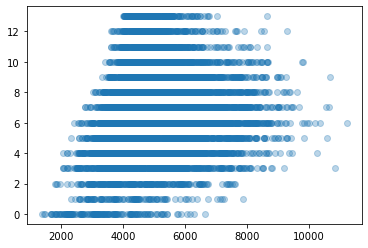

In [119]:
plt.scatter(intvol, sna_em3.zslices, alpha=0.3)

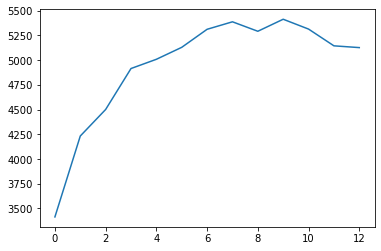

In [120]:
means = []
for n in range(0,13):
    means.append(np.nanmean(intvol[sna_em3.zslices == n].to_numpy()))
plt.plot(means)

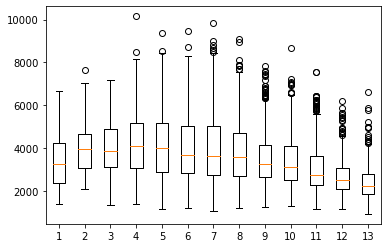

In [169]:
# Boxplot of original.
v = []
intvol_f = sna_em3.intvol.to_numpy().flatten()
zslices_f = sna_em3.zslices.to_numpy().flatten()
for i in range(0, 13):
    #v.append([intvol_f[zslices_f == i]])
    #temp = intvol[sna_em3.zslices == i]
    temp = intvol_f[zslices_f == i]
    temp = temp[~np.isnan(temp)]
    #temp = temp[~np.isnan(temp)]
    #print(len(temp))
    v.append(temp)
plt.boxplot(v);

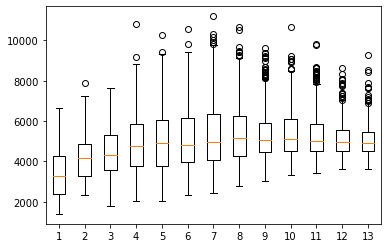

In [168]:
# Boxplot of corrected
v = []
intvol_f = intvol.to_numpy().flatten()
zslices_f = sna_em3.zslices.to_numpy().flatten()
for i in range(0, 13):
    #v.append([intvol_f[zslices_f == i]])
    #temp = intvol[sna_em3.zslices == i]
    temp = intvol_f[zslices_f == i]
    temp = temp[~np.isnan(temp)]
    #temp = temp[~np.isnan(temp)]
    #print(len(temp))
    v.append(temp)
plt.boxplot(v);

#### Conclusions

This looks at least reasonable. Using the 120-mers with identical imaging conditions to do the corrections would of course be the most rigorous, but this seems to be a solid start.

## Effects of depth correction

In [174]:
def mv_depth_correct(mv, slope=-338, slice_thickness=0.66, cols=[9,10,11]):
    corr_spot_data = correct_depth_spot_data(mv.spot_data)
    intvol = imp.movie.make_spot_table(corr_spot_data, mv.nucmask, 9)
    prot = imp.movie.make_spot_table(corr_spot_data, mv.nucmask, 11)
    return corr_spot_data, intvol, prot

In [175]:
sna_em3_corr_spotdata, sna_em3_corr_intvol, sna_em3_corr_prot = mv_depth_correct(sna_em3)

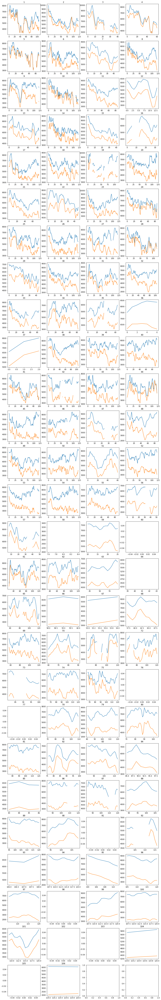

In [177]:
# Uncorrected vs. corrected for MS2 signal
nf.plot_traces(sna_em3_corr_intvol, sna_em3.intvol,sna_em3.stack[0],minlen=0, sigma=0.8, norm=False)

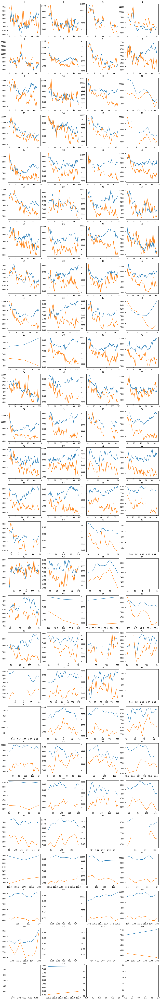

In [178]:
# Uncorrected vs. corrected for prot signal
nf.plot_traces(sna_em3_corr_prot, sna_em3.prot,sna_em3.stack[0],minlen=0, sigma=0.8, norm=False)

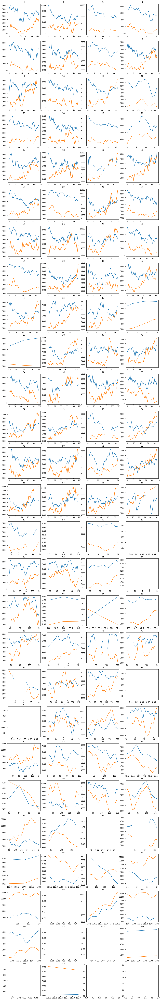

In [176]:
# Looking at the corrected signal vs. z slice
nf.plot_traces(sna_em3_corr_intvol, sna_em3.zslices*500,sna_em3.stack[0],minlen=0, sigma=0.8, norm=False)

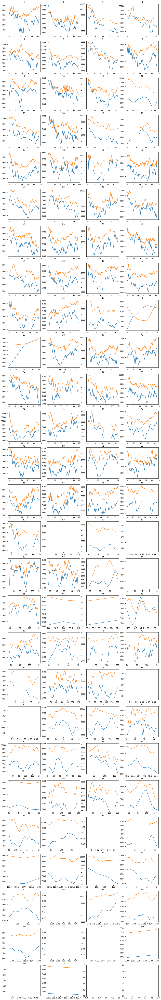

In [179]:
# Intvol vs. protein, with correction.
nf.plot_traces(sna_em3_corr_intvol, sna_em3_corr_prot,sna_em3.stack[0],minlen=0, sigma=0.8, norm=False)

In [180]:
hb_em1_corr_spotdata, hb_em1_corr_intvol, hb_em1_corr_prot = mv_depth_correct(hb_em1)

In [182]:
hb_em2_corr_spotdata, hb_em2_corr_intvol, hb_em2_corr_prot = mv_depth_correct(hb_em2)

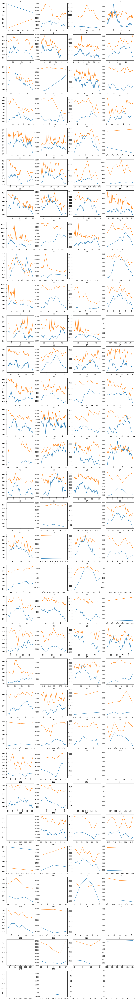

In [185]:
nf.plot_traces(hb_em1_corr_intvol, hb_em1_corr_prot, hb_em1.stack[0],minlen=0, sigma=0.4, norm=False)

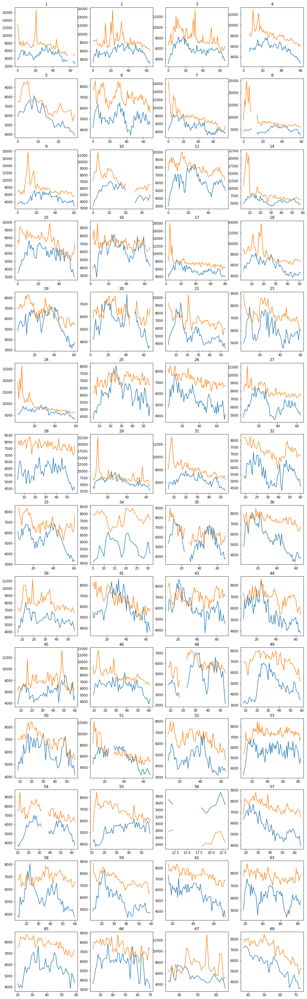

In [184]:
nf.plot_traces(hb_em2_corr_intvol, hb_em2_corr_prot, hb_em2.stack[0],minlen=30, sigma=0.4, norm=False)

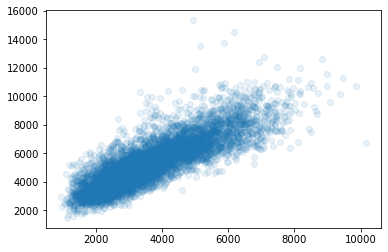

In [198]:
plt.scatter(sna_em3.intvol, sna_em3.prot, alpha=0.1);

Most of this has gotta be bleaching...

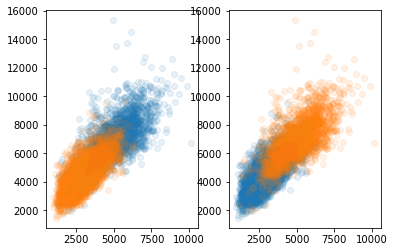

In [224]:
plt.subplot(121)
plt.scatter(sna_em3.intvol.iloc[:40,:], sna_em3.prot.iloc[:40,:], alpha=0.1);
plt.scatter(sna_em3.intvol.iloc[40:,:], sna_em3.prot.iloc[40:,:], alpha=0.1);
plt.subplot(122)
plt.scatter(sna_em3.intvol.iloc[40:,:], sna_em3.prot.iloc[40:,:], alpha=0.1);
plt.scatter(sna_em3.intvol.iloc[:40,:], sna_em3.prot.iloc[:40,:], alpha=0.1);


Yep. Let's try correcting.

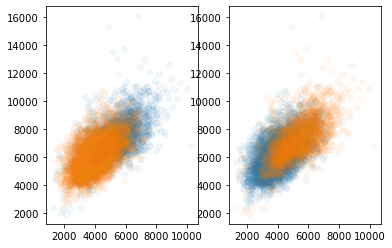

In [211]:
intvol_bc = nf.bleach_corr(sna_em3.intvol, sna_em3.stack[0])
prot_bc = nf.bleach_corr(sna_em3.prot, sna_em3.stack[0])
plt.subplot(121)
plt.scatter(intvol_bc.iloc[:40,:], prot_bc.iloc[:40,:], alpha=0.05);
plt.scatter(intvol_bc.iloc[40:,:], prot_bc.iloc[40:,:], alpha=0.05);
plt.subplot(122)
plt.scatter(intvol_bc.iloc[40:,:], prot_bc.iloc[40:,:], alpha=0.05);
plt.scatter(intvol_bc.iloc[:40,:], prot_bc.iloc[:40,:], alpha=0.05);


Bleaching is not fully accounted for. Can we use the nuclear mask?

In [217]:
def bleach_corr2(df, stack4d, nucmask, sigma=10):
    """Perform bleach correction on a pandas df using the segmented 
    nuclear signal."""
    nucs_only = np.where(nucmask.astype(bool), stack4d, np.nan)
    frame_means = np.nanmean(nucs_only, axis=(1,2,3))
    frame_means_smooth = ndi.gaussian_filter(frame_means, sigma=sigma)
    means_norm = frame_means_smooth / frame_means_smooth[0]
    return df.apply(lambda x: x / means_norm, axis=0)

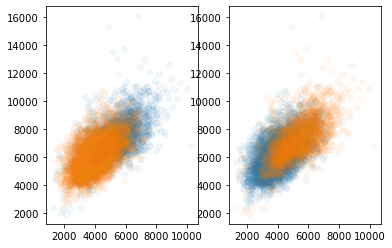

In [226]:
intvol_bc2 = bleach_corr2(sna_em3.intvol, sna_em3.stack[0], sna_em3.nucmask)
prot_bc2 = bleach_corr2(sna_em3.prot, sna_em3.stack[0], sna_em3.nucmask)
plt.subplot(121)
plt.scatter(intvol_bc.iloc[:40,:], prot_bc.iloc[:40,:], alpha=0.05);
plt.scatter(intvol_bc.iloc[40:,:], prot_bc.iloc[40:,:], alpha=0.05);
plt.subplot(122)
plt.scatter(intvol_bc.iloc[40:,:], prot_bc.iloc[40:,:], alpha=0.05);
plt.scatter(intvol_bc.iloc[:40,:], prot_bc.iloc[:40,:], alpha=0.05);

Hmmm, doesn't seem any better. Oh well, the bleaching correction works reasonably well. We could get more sophisticated about it for sure.

Let's compare depth-corrected vs. not, with bleach correction:

In [227]:
intvol_bc2_depthcorr = bleach_corr2(sna_em3_corr_intvol, sna_em3.stack[0], sna_em3.nucmask)
prot_bc2_depthcorr = bleach_corr2(sna_em3_corr_prot, sna_em3.stack[0], sna_em3.nucmask)

(1500.0, 10000.0)

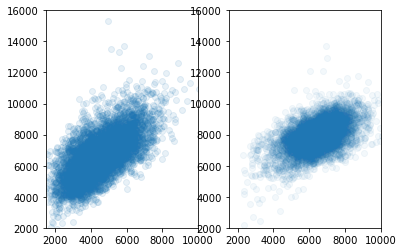

In [248]:
plt.subplot(121)
plt.scatter(intvol_bc2, prot_bc2, alpha=0.1)
plt.ylim(2000,16000)
plt.xlim(1500,10000)
plt.subplot(122)
plt.scatter(intvol_bc2_depthcorr, prot_bc2_depthcorr, alpha=0.05)
plt.ylim(2000,16000)
plt.xlim(1500,10000)

In [237]:
from scipy import stats

In [245]:
stats.spearmanr(intvol_bc2.to_numpy().flatten(), prot_bc2.to_numpy().flatten(), nan_policy='omit')

SpearmanrResult(correlation=0.6516400610176417, pvalue=0.0)

In [246]:
stats.spearmanr(intvol_bc2_depthcorr.to_numpy().flatten(), prot_bc2_depthcorr.to_numpy().flatten(), nan_policy='omit')

SpearmanrResult(correlation=0.475131681856258, pvalue=0.0)

This is good. This shows that some of the correlation in the signal was due to embryo depth, which we would expect as the locus moving up or down would impact the signal in both channels, producing the artificial appearance of correlation. Still a nice solid correlation.

### What about drift?

Between focus corrections and drift, Z slice number doesn't actually reliably indicate embryo depth. I thought about this for a while, and I think trying to correct for drift in some clever way isn't likely worth it. The focus adjustments done at the scope actually mostly take care of that — they are designed to essentiallly keep the sample in the same z positions. The adjustments are rarely more than 1 frame, so they shouldn't make a huge difference. I think we can mostly ignore drift for now.

### More?

So that's two sources of spurious signal correlation — bleaching and Z depth. Are there more? What would be a test? Two experimental controls would be useful:

1. Image MS2 mcherry together with 120mers. If properly corrected, 120-mer intensity should be stable across time or Z slice. This can be done with a trans-het, since the MCP is only there for Z focusing and the 120mer intensity should be independent of het/homo status.  
2. Image MS2 mCherry together with a neutral signal, histone-GFP preferably (Zelda could work with more caveats). Victoria has a PCP-GFP MCP-mcherry line that could be useful.

Number 2 is a critical test, in general. Any interesting signal from the Rpb1 data should of course be absent from control data.